# Calculates and plot UHI annual cycles and anomaly climatology for Paris

## Load libraries

Here we load the required libraries to execute the notebook. Note that specific code from dedicated scripts (`utils.py`, `urban_areas.py`, ...) is also loaded here.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
!echo $CONDA_DEFAULT_ENV

jsc


In [3]:
import os

import pandas as pd
import numpy as np
from urclimask.GHCNd_stations import get_valid_timeseries, inside_city
from urclimask.UHI_analysis import UrbanIsland
from urclimask.urban_areas import UrbanVicinity
from urclimask.utils import load_ucdb_city, traverseDir

In [4]:
import matplotlib.pyplot as plt

In [5]:
from tools import (
    check_equal_period,
    fix_360_longitudes,
    open_datasets,
    standardize_unit,
)

In [6]:
import xarray as xr

In [7]:
import sys

In [8]:
save_results_path = os.path.abspath(
    os.path.join(os.getcwd(), "..", "intermediate-results")
)
save_figure_path = os.path.abspath(os.path.join(os.getcwd(), "..", "plots"))
save_results_path = os.path.abspath(
    os.path.join(os.getcwd(), "..", "intermediate-results")
)
save_figure_path = os.path.abspath(os.path.join(os.getcwd(), "..", "plots"))
save_figure_dataset = os.path.abspath(os.path.join(os.getcwd(), "..", "datasets"))

# CORDEX-EUR-CMIP6

In [9]:
city = "Paris"

domain = "EUR-11"
model = "REMO"
scenario = "evaluation"

urban_var = "sfturf"

urban_th = 40
urban_sur_th = 5
orog_diff = 100
sftlf_th = 70
ratio_r2u = 2
min_city_size = 30
lon_lim = 1
lat_lim = 1
height_station = 100

variable = "tasmin"
period_star = "1991"
period_stop = "2020"
period = slice(period_star, period_stop)

domain_resolution = int(domain.split("-")[1])

In [10]:
import yaml

# Cargar el archivo YAML
with open("cities.yaml", "r") as f:
    cities = yaml.safe_load(f)
lat_city = cities[city]["lat"]
lon_city = cities[city]["lon"]

if cities[city].get("urban_th") is not None:
    urban_th = cities[city].get("urban_th")

if cities[city].get("orog_diff") is not None:
    orog_diff= cities[city].get("orog_diff")

if cities[city].get("height_station") is not None:
    height_station= cities[city].get("height_station")

# CMIP6

In [11]:
mip_era = "CMIP6"
driving_source_id = "ERA5"
frequency = "mon"#1hr/mon

In [12]:
import pandas as pd

def get_filtered_source_ids(catalog_path):
    df = pd.read_excel(catalog_path)
    df_filtered = df
    source_ids = df_filtered["source_id"].dropna().unique().tolist()
    return source_ids

catalog_file = "catalog.xlsx"
source_id_list = get_filtered_source_ids(catalog_file)

In [13]:
dsets = open_datasets(
    [variable],
    frequency=frequency,
    driving_source_id=driving_source_id,
    mask=True,
    add_missing_bounds=False,
    source_id = source_id_list
)

Opening catalog from https://euro-cordex.s3.eu-central-1.amazonaws.com/catalog/CORDEX-CMIP6-JSC.json
Found 17 source ids for variables ['tasmin']: ['RACMO23E', 'ICON-CLM-202407-1-1', 'CCLM6-0-1', 'CCLM6-0-1-URB', 'HCLIM43-ALADIN', 'ROAM-NBS', 'HadREM3-GA7-05', 'REMO2020-2-2-iMOVE-LUC', 'REMO2020-2-2-MR2', 'REMO2020-2-2-TEB', 'REMO2020-2-2', 'REMO2020-2-2-iMOVE', 'WRF451Q', 'CCLM6-0-1-URB-ESG', 'CNRM-ALADIN64E1', 'RegCM5-0', 'ALARO1-SFX']

--> The keys in the returned dictionary of datasets are constructed as follows:
	'project_id.domain_id.institution_id.driving_source_id.driving_experiment_id.driving_variant_label.source_id.version_realization.frequency.version'


decoding dataset CORDEX-CMIP6.EUR-12.HCLIMcom-SMHI.ERA5.evaluation.r1i1p1f1.HCLIM43-ALADIN.v1-r1.fx.v20241205
Found 38 datasets
decoding dataset CORDEX-CMIP6.EUR-12.RMIB-UGent.ERA5.evaluation.r1i1p1f1.ALARO1-SFX.v1-r1.fx.v20241009
Found 38 datasets
decoding dataset CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.fx.v20260219
Found 38 datasets
decoding dataset CORDEX-CMIP6.EUR-12.CNRM-MF.ERA5.evaluation.r1i1p1f1.CNRM-ALADIN64E1.v1-r1.fx.v20250505
Warning for CORDEX-CMIP6.EUR-12.CNRM-MF.ERA5.evaluation.r1i1p1f1.CNRM-ALADIN64E1.v1-r1.fx.v20250505: Variable(s) referenced in cell_measures not in variables: ['areacella']
Warning for CORDEX-CMIP6.EUR-12.CNRM-MF.ERA5.evaluation.r1i1p1f1.CNRM-ALADIN64E1.v1-r1.fx.v20250505: Variable(s) referenced in cell_measures not in variables: ['areacella']
Found 38 datasets
decoding dataset CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-TEB.v1-r1.fx.v20251028
Warning for CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i

/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/evaltools/evaltools/fix.py:93: UserWarning: Grid mapping has (198.0, 39.25) which is inconsistent with (-162.0, 39.25) for EUR-12 and CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.fx.v20260219.
  warnings.warn(message)
/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/evaltools/evaltools/fix.py:139: UserWarning: Renaming X and Y axis to be named rlon and rlat for rotated_latitude_longitude grid mapping: CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.fx.v20260219
  warnings.warn(
/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/evaltools/evaltools/fix.py:151: UserWarning: Renaming coordinates longitude and latitude to be named lon and lat: CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.fx.v20260219
  warnings.warn(


Renaming grid mapping variable rotated_latitude_longitude to 'crs' for CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-TEB.v1-r1.fx.v20251028
Renaming grid mapping variable rotated_latitude_longitude to 'crs' for CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE-LUC.v1-r1.fx.v20250515
Renaming grid mapping variable rotated_latitude_longitude to 'crs' for CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-MR2.v1-r1.fx.v20241120
Warning for CORDEX-CMIP6.EUR-12.CLMcom-KUL.ERA5.evaluation.r1i1p1f1.CCLM6-0-1-URB-ESG.v1-r1.fx.v20260305: "Receive multiple variables for key 'grid_mapping': ['crs', 'rotated_pole']. Expected only one. Please pass a list ['grid_mapping'] instead to get all variables matching 'grid_mapping'."
Warning for CORDEX-CMIP6.EUR-12.CLMcom-KUL.ERA5.evaluation.r1i1p1f1.CCLM6-0-1-URB-ESG.v1-r1.fx.v20260305: Found multiple grid mapping variables ['crs', 'rotated_pole']
Warning for CORDEX-CMIP6.EUR-12.CLMcom-KUL.ERA5.evaluati

/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/evaltools/evaltools/fix.py:93: UserWarning: Grid mapping has (198.0, 39.25) which is inconsistent with (-162.0, 39.25) for EUR-12 and CORDEX-CMIP6.EUR-12.ICTP.ERA5.evaluation.r1i1p1f1.RegCM5-0.v1-r1.mon.v20250415.
  warnings.warn(message)


Renaming grid mapping variable rotated_latitude_longitude to 'crs' for CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2.v1-r1.mon.v20241120
Renaming grid mapping variable rotated_pole to 'crs' for CORDEX-CMIP6.EUR-12.AUTH.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r3.mon.v20250630
Renaming grid mapping variable rotated_pole to 'crs' for CORDEX-CMIP6.EUR-12.IDL-FCUL.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r1.mon.v20240630


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/evaltools/evaltools/fix.py:93: UserWarning: Grid mapping has (18.0, 39.25) which is inconsistent with (-162.0, 39.25) for EUR-12 and CORDEX-CMIP6.EUR-12.AUTH.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r3.mon.v20250630.
  warnings.warn(message)


Renaming grid mapping variable rotated_latitude_longitude to 'crs' for CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.mon.v20260219
Renaming grid mapping variable rotated_latitude_longitude to 'crs' for CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.mon.v20260318


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/evaltools/evaltools/fix.py:93: UserWarning: Grid mapping has (198.0, 39.25) which is inconsistent with (-162.0, 39.25) for EUR-12 and CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.mon.v20260219.
  warnings.warn(message)
/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/evaltools/evaltools/fix.py:139: UserWarning: Renaming X and Y axis to be named rlon and rlat for rotated_latitude_longitude grid mapping: CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.mon.v20260219
  warnings.warn(
/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/evaltools/evaltools/fix.py:151: UserWarning: Renaming coordinates longitude and latitude to be named lon and lat: CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.mon.v20260219
  warnings.warn(
/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/evaltools/evaltools/fix.py:139: UserWarning: Renaming X and Y axis to be named rlon and rlat for rotated_latitude_longitude grid mappin

Renaming grid mapping variable rotated_latitude_longitude to 'crs' for CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE.v1-r1.fx.v20250515
Renaming grid mapping variable rotated_latitude_longitude to 'crs' for CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-MR2.v1-r1.mon.v20241120


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/evaltools/evaltools/fix.py:100: UserWarning: fx variable should not contain time dimension: CORDEX-CMIP6.EUR-12.CLMcom-Hereon.ERA5.evaluation.r1i1p1f1.CCLM6-0-1.v1-r1.fx.v20230222
  warnings.warn(f"fx variable should not contain time dimension: {iid}")
/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/evaltools/evaltools/fix.py:101: UserWarning: Trying to drop time dimension from fx variable: CORDEX-CMIP6.EUR-12.CLMcom-Hereon.ERA5.evaluation.r1i1p1f1.CCLM6-0-1.v1-r1.fx.v20230222
  warnings.warn(f"Trying to drop time dimension from fx variable: {iid}")


Renaming grid mapping variable rotated_latitude_longitude to 'crs' for CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-TEB.v1-r1.mon.v20251028
Renaming grid mapping variable rotated_latitude_longitude to 'crs' for CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE-LUC.v1-r1.mon.v20250515
merging CORDEX-CMIP6.EUR-12.CESAM-UA.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r2.mon.v20250630 with CORDEX-CMIP6.EUR-12.CESAM-UA.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r2.fx.v20250630
merging CORDEX-CMIP6.EUR-12.RMIB-UGent.ERA5.evaluation.r1i1p1f1.ALARO1-SFX.v1-r1.mon.v20241009 with CORDEX-CMIP6.EUR-12.RMIB-UGent.ERA5.evaluation.r1i1p1f1.ALARO1-SFX.v1-r1.fx.v20241009
merging CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE.v1-r1.mon.v20250515 with CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE.v1-r1.fx.v20250515
merging CORDEX-CMIP6.EUR-12.ICTP.ERA5.evaluation.r1i1p1f1.RegCM5-0.v1-r1.mon.v20250415 with CORDEX-CMIP6.EUR-12.ICTP.E

In [14]:
# delete simulatios with not urban static variable
to_delete = [dset for dset, ds in dsets.items() if urban_var not in ds.variables]

for dset in to_delete:
    print(dset)
    del dsets[dset]

CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE-LUC.v1-r1.mon.v20250515
CORDEX-CMIP6.EUR-12.CLMcom-Hereon.ERA5.evaluation.r1i1p1f1.CCLM6-0-1.v1-r1.mon.v20230222


In [15]:
for dset in dsets.keys():
    #dsets[dset] = dsets[dset].sel(time=period).compute()
    dsets[dset] = dsets[dset].sel(time=period)

In [16]:
for dset in dsets.keys():
    if not check_equal_period(dsets[dset], period):
        print(f"Temporal coverage of {dset} does not match with {period}")

Temporal coverage of CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.mon.v20260219 does not match with slice('1991', '2020', None)


In [17]:
dsets.pop("CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.mon.v20260219", None)
dsets.pop("CORDEX-CMIP6.EUR-12.CESAM-UA.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r2.mon.v20250630", None)
dsets.pop("CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-MR2.v1-r1.mon.v20241120", None)
dsets.pop("CORDEX-CMIP6.EUR-12.ICTP.ERA5.evaluation.r1i1p1f1.RegCM5-0.v1-r1.mon.v20250415", None)

for dset in dsets.keys():
    print(dset)
    dsets[dset] = standardize_unit(dsets[dset], variable)

CORDEX-CMIP6.EUR-12.RMIB-UGent.ERA5.evaluation.r1i1p1f1.ALARO1-SFX.v1-r1.mon.v20241009
CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE.v1-r1.mon.v20250515
CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2.v1-r1.mon.v20241120
CORDEX-CMIP6.EUR-12.IDL-FCUL.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r1.mon.v20240630
CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.mon.v20260318
CORDEX-CMIP6.EUR-12.DWD-BSH.ERA5.evaluation.r1i1p1f1.ROAM-NBS.v1-r1.mon.v20240920
CORDEX-CMIP6.EUR-12.KNMI.ERA5.evaluation.r1i1p1f1.RACMO23E.v1-r1.mon.v20241216
CORDEX-CMIP6.EUR-12.CNRM-MF.ERA5.evaluation.r1i1p1f1.CNRM-ALADIN64E1.v1-r1.mon.v20250505
CORDEX-CMIP6.EUR-12.CLMcom-KUL.ERA5.evaluation.r1i1p1f1.CCLM6-0-1-URB-ESG.v1-r1.mon.v20260305
CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-TEB.v1-r1.mon.v20251028
CORDEX-CMIP6.EUR-12.HCLIMcom-SMHI.ERA5.evaluation.r1i1p1f1.HCLIM43-ALADIN.v1-r1.mon.v20241205
CORDEX-CMIP6.EUR-12.CLMcom-Hereon.ERA5.eval

## Define urban areas and vicinity

In [18]:
root_aux_data = "/mnt/CORDEX_CMIP6_tmp/aux_data/"
ucdb_city = load_ucdb_city(root_aux_data, city)

### Load static variables
Load static variables, such as urban fraction (sfturf), terrain elevation (orography) or land-sea fraction (sftlf).

In [19]:
keys = [k for k in dsets.keys()]

In [20]:
if city == 'Paris':
    var_map = {
        'tas': 'TAVG',
        'tasmin': 'TMIN',
        'tasmax': 'TMAX',
        'pr': 'PRCP',
        'sfcWind': 'SNWD',
        'hurs': 'U'
    }
else:
    var_map = {
        'tasmin': 'tasmin',
        'tasmax': 'tasmax',
        'pr': 'pr',
        'sfcWind': 'sfcWind',
        'hurs': 'hurs'
    }

In [21]:
root = "/mnt/CORDEX_CMIP6_tmp/aux_data/PARIS_surface_weather_data/"
files_obs_paris = list(traverseDir(root, '.csv'))
files_obs_paris = [f for f in files_obs_paris if "198001" in f]


df_all = []
for file in files_obs_paris:

    if variable == 'pr':
        var_paris = 'RR1'
    elif variable == 'tas':
        var_paris = 'T'
    elif variable == 'tasmax':
        var_paris = 'T'
    elif variable == 'tasmin':
        var_paris = 'T'
    elif variable == 'sfcWind':
        var_paris = 'FF'
    elif variable == 'hurs':
        var_paris = 'U'
    
    df = pd.read_csv(
        file,
        sep=";",
        decimal=",",
        na_values=["", " "]
    )


    df["date"] = pd.to_datetime(df["DATE"], format="%Y%m%d%H")
    df.set_index("date", inplace=True)
    df = df.sort_index()
    df.drop(columns=['DATE'], inplace=True)

    df_var = pd.DataFrame(index = df.index)
    df_var[var_map.get(variable, None)] = df[var_paris]
    df_var['NAME'] = file.split('/')[-1].split('_')[-1].split('.csv')[0]
    df_var['code'] = df['POSTE'].values
    df_var['code'] = df_var['code'].astype(int)

    df_all.append(df_var)


df_obs_Paris = pd.concat(df_all)


/tmp/ipykernel_2174222/890889989.py:22: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2174222/890889989.py:22: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2174222/890889989.py:22: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2174222/890889989.py:22: DtypeWarning: Columns (3,7,9,11,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2174222/890889989.py:22: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2174222/890889989.py:22: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_217422

In [22]:
if city == 'Paris':
    
    root = "/mnt/CORDEX_CMIP6_tmp/aux_data/PARIS_surface_weather_data/"
    files_obs_paris = list(traverseDir(root, '.csv'))
    files_obs_paris = [f for f in files_obs_paris if "198001" in f]
    
    df_all = []
    for file in files_obs_paris:
    
        if variable == 'pr':
            var_paris = 'RR1'
        elif variable in ['tas', 'tasmax', 'tasmin']:
            var_paris = 'T'
        elif variable == 'sfcWind':
            var_paris = 'FF'
    
        df = pd.read_csv(
            file,
            sep=";",
            decimal=",",
            na_values=["", " "]
        )
    
        df["DATE"] = pd.to_datetime(df["DATE"], format="%Y%m%d%H")
        df.set_index("DATE", inplace=True)
        df = df.sort_index()
    
        # Extrae código de estación
        station_code = df["POSTE"].iloc[0]
        station_name = file.split('/')[-1].split('_')[-1].split('.csv')[0]
    
        if variable == 'tasmax':
            df_daily = df[[var_paris]].resample("D").max()
        elif variable == 'tasmin':
            df_daily = df[[var_paris]].resample("D").min()
        else:
            df_daily = df[[var_paris]]
    
        df_var = pd.DataFrame(index=df_daily.index)
        df_var[var_map.get(variable, None)] = df_daily[var_paris]
        df_var["NAME"] = station_name
        df_var["code"] = station_code
    
        df_all.append(df_var)
    
    df_obs = pd.concat(df_all)


/tmp/ipykernel_2174222/1441144266.py:17: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2174222/1441144266.py:17: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2174222/1441144266.py:17: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2174222/1441144266.py:17: DtypeWarning: Columns (3,7,9,11,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2174222/1441144266.py:17: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2174222/1441144266.py:17: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_

## Calculate UHI and plots for each models

CORDEX-CMIP6.EUR-12.RMIB-UGent.ERA5.evaluation.r1i1p1f1.ALARO1-SFX.v1-r1.mon.v20241009


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31
There are 2 series inside the city and 3 outside


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE.v1-r1.mon.v20250515


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 2 series inside the city and 3 outside
CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2.v1-r1.mon.v20241120


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31
There are 2 series inside the city and 3 outside


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


CORDEX-CMIP6.EUR-12.IDL-FCUL.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r1.mon.v20240630
Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 2 series inside the city and 3 outside
CORDEX-CMIP6.EUR-12.MOHC.ERA5.evaluation.r1i1p1f1.HadREM3-GA7-05.v1-r1.mon.v20260318


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31
There are 2 series inside the city and 3 outside


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


CORDEX-CMIP6.EUR-12.DWD-BSH.ERA5.evaluation.r1i1p1f1.ROAM-NBS.v1-r1.mon.v20240920


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31
There are 2 series inside the city and 3 outside


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


CORDEX-CMIP6.EUR-12.KNMI.ERA5.evaluation.r1i1p1f1.RACMO23E.v1-r1.mon.v20241216


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31
There are 2 series inside the city and 3 outside


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]
/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/UHI_analysis.py:299: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(15, 7))


CORDEX-CMIP6.EUR-12.CNRM-MF.ERA5.evaluation.r1i1p1f1.CNRM-ALADIN64E1.v1-r1.mon.v20250505


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31
There are 2 series inside the city and 3 outside


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


CORDEX-CMIP6.EUR-12.CLMcom-KUL.ERA5.evaluation.r1i1p1f1.CCLM6-0-1-URB-ESG.v1-r1.mon.v20260305


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31
There are 2 series inside the city and 3 outside


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-TEB.v1-r1.mon.v20251028
Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 2 series inside the city and 3 outside
CORDEX-CMIP6.EUR-12.HCLIMcom-SMHI.ERA5.evaluation.r1i1p1f1.HCLIM43-ALADIN.v1-r1.mon.v20241205


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 2 series inside the city and 3 outside
CORDEX-CMIP6.EUR-12.CLMcom-Hereon.ERA5.evaluation.r1i1p1f1.ICON-CLM-202407-1-1.v1-r1.mon.v20240920


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31
There are 2 series inside the city and 3 outside


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


CORDEX-CMIP6.EUR-12.CLMcom-CMCC.ERA5.evaluation.r1i1p1f1.CCLM6-0-1-URB.v1-r1.mon.v20250201
Paris -- CHARTRES - TMIN has 2052.9% valid records in 1991-01-01 to 2020-12-31
Paris -- PARIS-MONTSOURIS - TMIN has 2071.3% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - TMIN has 2054.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - TMIN has 2052.1% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - TMIN has 2047.2% valid records in 1991-01-01 to 2020-12-31
There are 2 series inside the city and 3 outside


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


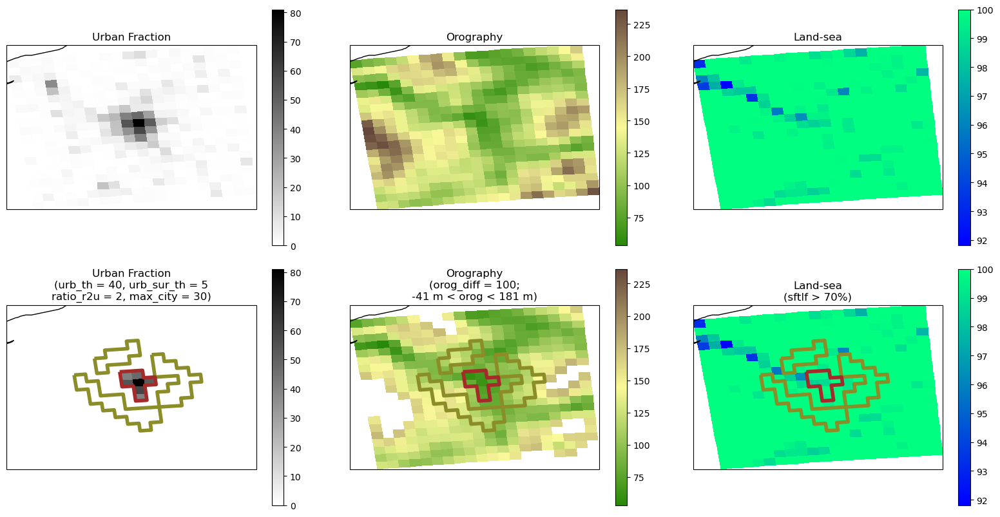

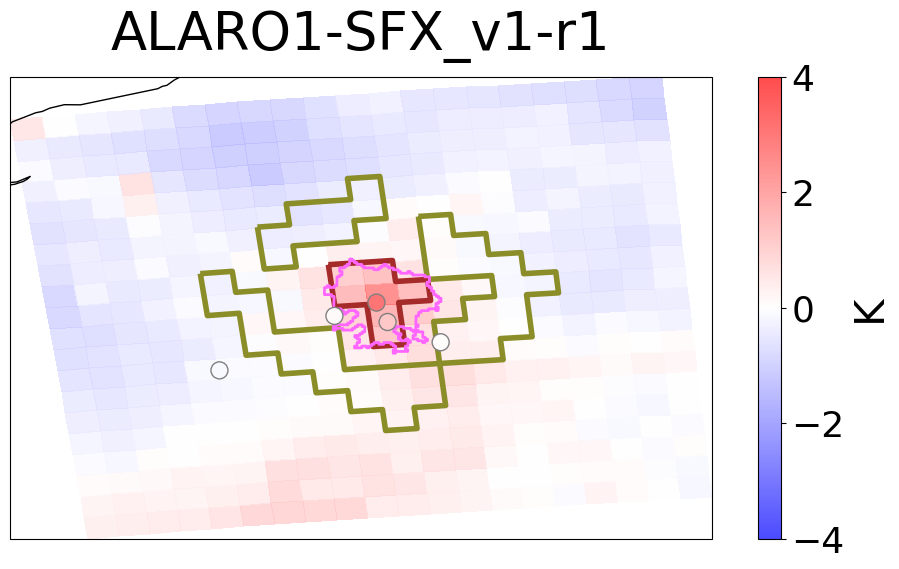

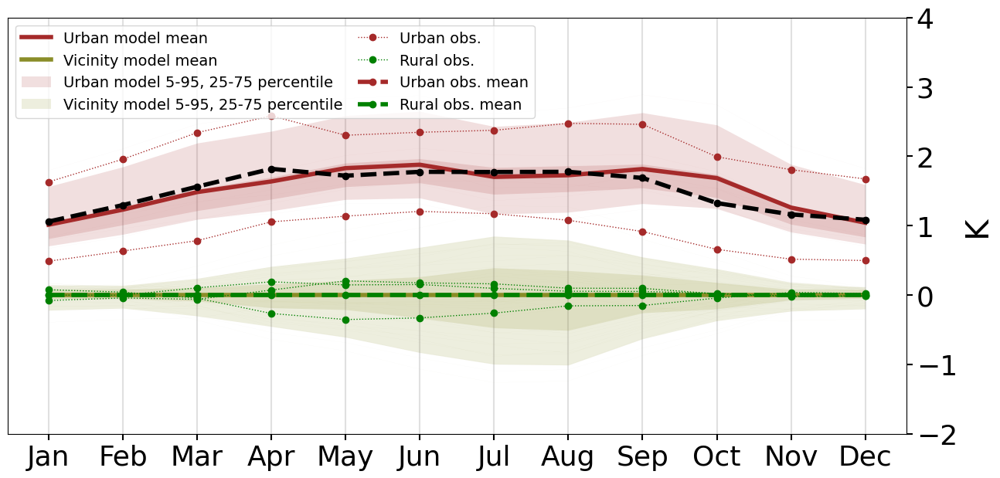

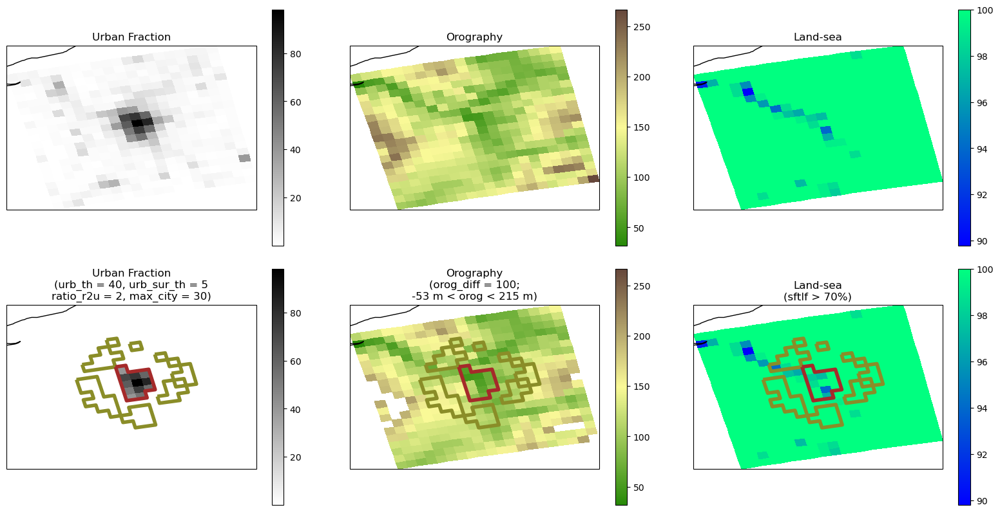

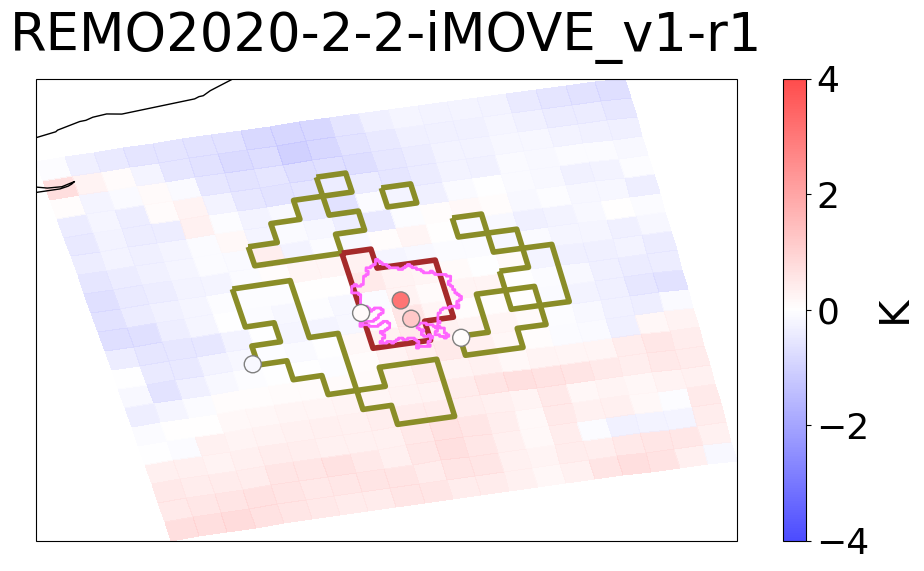

...

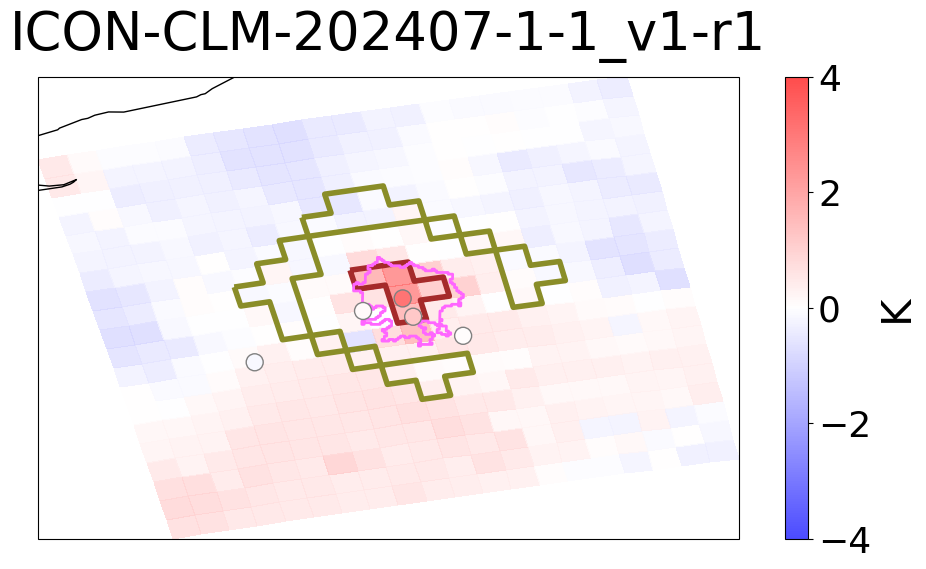

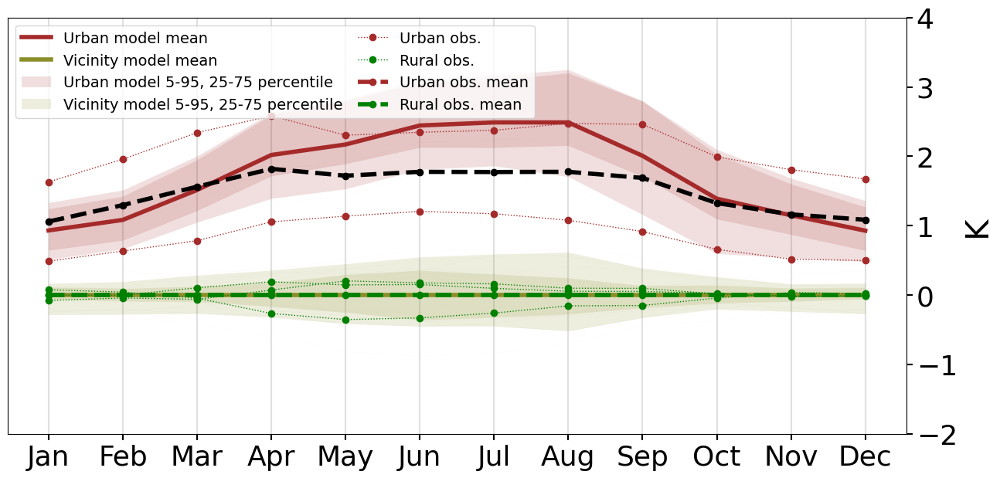

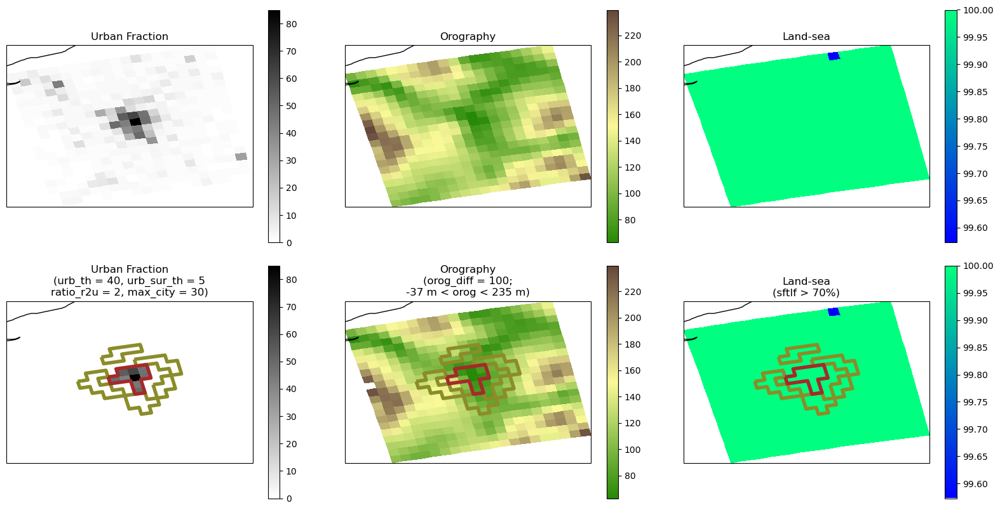

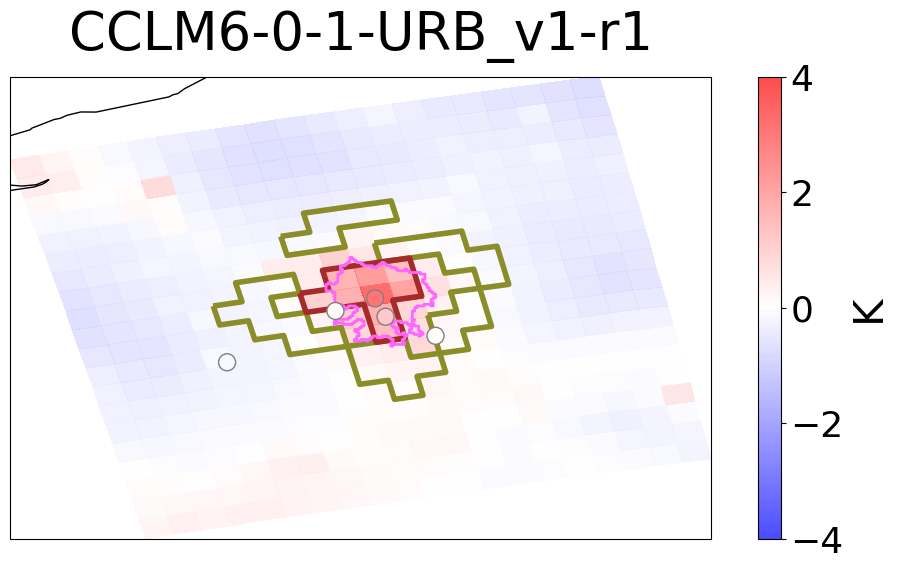

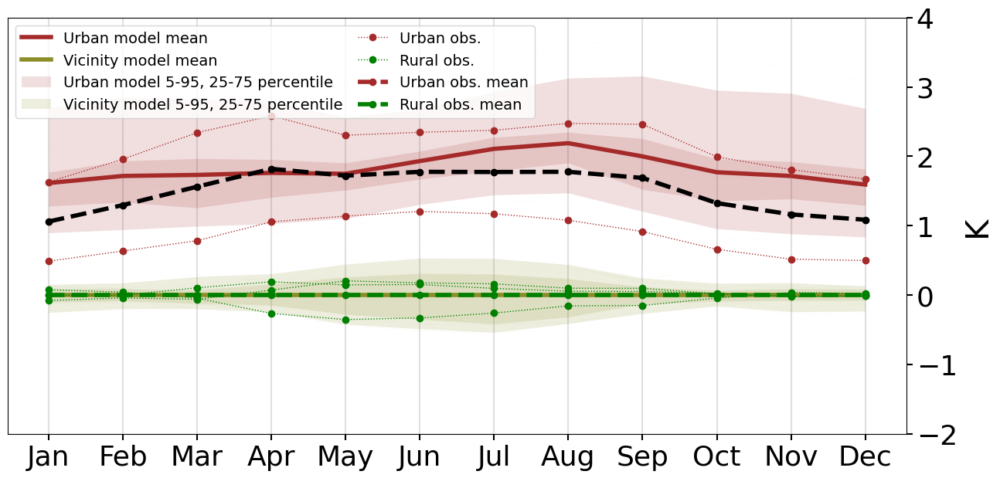

In [23]:
rcm_names = []

for dset, ds in dsets.items():

    print(dset)

    # ---------------------------------------------------------------------
    # Fix longitude convention
    # ---------------------------------------------------------------------
    ds = fix_360_longitudes(ds, lonname="lon")

    # ---------------------------------------------------------------------
    # Load required static variables
    # ---------------------------------------------------------------------
    ds_sfturf = ds[[urban_var]].compute()
    ds_orog = ds[["orog"]].compute()
    ds_sftlf = ds[["sftlf"]].compute()

    # ---------------------------------------------------------------------
    # Identify RCM name
    # ---------------------------------------------------------------------
    try:
        rcm_name = f"{ds.attrs['model_id']}_{ds.attrs['rcm_version_id']}"
    except Exception:
        rcm_name = f"{ds.attrs['source_id']}_{ds.attrs['version_realization']}"

    rcm_names.append(rcm_name)

    # ---------------------------------------------------------------------
    # Initialize UrbanVicinity object
    # ---------------------------------------------------------------------
    URBAN = UrbanVicinity(
        urban_sur_th=urban_sur_th,
        orog_diff=orog_diff,
        sftlf_th=sftlf_th,
        ratio_r2u=ratio_r2u,
        min_city_size=min_city_size,
        lon_city=lon_city,
        lat_city=lat_city,
        lon_lim=lon_lim,
        lat_lim=lat_lim,
        model=model,
        domain=domain,
        urban_th=urban_th,
        urban_var=urban_var,
    )

    # ---------------------------------------------------------------------
    # Crop static variables around the city
    # ---------------------------------------------------------------------
    ds_sfturf = URBAN.crop_area_city(ds=ds_sfturf, res=domain_resolution)
    ds_orog   = URBAN.crop_area_city(ds=ds_orog, res=domain_resolution)
    ds_sftlf  = URBAN.crop_area_city(ds=ds_sftlf, res=domain_resolution)

    # ---------------------------------------------------------------------
    # Define masks
    # ---------------------------------------------------------------------
    sfturf_mask, sfturf_sur_mask, orog_mask, sftlf_mask = URBAN.define_masks(
        ds_sfturf=ds_sfturf,
        ds_orog=ds_orog,
        ds_sftlf=ds_sftlf,
    )

    # ---------------------------------------------------------------------
    # Define rural vicinity
    # ---------------------------------------------------------------------
    urmask = URBAN.select_urban_vicinity(
        sfturf_mask=sfturf_mask,
        orog_mask=orog_mask,
        sftlf_mask=sftlf_mask,
        sfturf_sur_mask=sfturf_sur_mask,
    )

    # ---------------------------------------------------------------------
    # Save mask
    # ---------------------------------------------------------------------
    output_urmask_nc_path = f"{save_figure_dataset}/CMIP6_{city}_urmask_{rcm_name}.nc"

    if not os.path.exists(output_urmask_nc_path):
        urmask.to_netcdf(output_urmask_nc_path)

    # ---------------------------------------------------------------------
    # Plot static variables
    # ---------------------------------------------------------------------
    fig = URBAN.plot_static_variables(
        ds_sfturf=ds_sfturf,
        ds_orog=ds_orog,
        ds_sftlf=ds_sftlf,
        sfturf_mask=sfturf_mask,
        orog_mask=orog_mask,
        sftlf_mask=sftlf_mask,
        urban_areas=urmask,
    )

    plt.savefig(
        f"{save_figure_path}/CMIP6_{city}_static_{variable}_{rcm_name}.png",
        bbox_inches="tight",
    )

    # ---------------------------------------------------------------------
    # Load model variable
    # ---------------------------------------------------------------------
    ds_RCM = URBAN.crop_area_city(ds=ds[[variable]], res=domain_resolution)

    # ---------------------------------------------------------------------
    # Load observational station data
    # ---------------------------------------------------------------------
    output_file = "/mnt/CORDEX_CMIP6_tmp/aux_data/PARIS_surface_weather_data/Data_MF_1980-2017.csv"

    selected_codes = ["28070001", "75114001", "77306001", "78620001", "91027002"]

    stan_data = (
        pd.read_csv(output_file)
        .assign(code=lambda df: df["code"].astype(str))
        .query("code in @selected_codes")
        .reset_index(drop=True)
    )

    # ---------------------------------------------------------------------
    # Extract valid observational time series
    # ---------------------------------------------------------------------
    valid_obs, time_series_obs, ds_RCM_period = get_valid_timeseries(
        city,
        stan_data,
        ds_RCM,
        df_obs_Paris,
        variable,
        idate="1991-01-01",
        fdate="2020-12-31",
        var_map=var_map,
        divide=1,
    )

    valid_obs = inside_city(valid_obs, ucdb_city)

    # ---------------------------------------------------------------------
    # Variable-specific anomaly settings
    # ---------------------------------------------------------------------
    if variable == "pr":
        valid_obs = pd.DataFrame()
        time_series_obs = pd.DataFrame()
        anomaly = "rel"
        vmax, vmin = 25, -25
    else:
        anomaly = "abs"
        vmax, vmin = 4, -2

    # ---------------------------------------------------------------------
    # Temporal aggregation
    # ---------------------------------------------------------------------
    if frequency == "1hr":
        if variable == "tasmax":
            ds_RCM_day = ds_RCM.resample(time="D").max()
        elif variable == "tasmin":
            ds_RCM_day = ds_RCM.resample(time="D").min()
        else:
            ds_RCM_day = ds_RCM.copy()
    else:
        ds_RCM_day = ds_RCM.copy()

    if not time_series_obs.empty:

        freq = pd.infer_freq(time_series_obs.index)

        if freq == "h":
            if variable == "tasmax":
                time_series_obs_day = time_series_obs.resample("D").max()
            elif variable == "tasmin":
                time_series_obs_day = time_series_obs.resample("D").min()
            else:
                time_series_obs_day = time_series_obs
        else:
            time_series_obs_day = time_series_obs

    else:
        time_series_obs_day = pd.DataFrame()

    # ---------------------------------------------------------------------
    # Compute UHI
    # ---------------------------------------------------------------------
    UHI = UrbanIsland(
        ds=ds_RCM_day[variable],
        urban_vicinity=urmask,
        rcm=rcm_name,
        anomaly=anomaly,
        obs_attributes=valid_obs,
        obs_timeseries=time_series_obs_day,
    )

    # ---------------------------------------------------------------------
    # Plot UHI map
    # ---------------------------------------------------------------------
    fig = UHI.plot_UI_map(city_name=city, ucdb_city=ucdb_city, vmax=vmax)
    
    n_axes = len(fig.axes)
    
    # Fix colorbar ticks position
    for i, ax in enumerate(fig.axes):
        for im in ax.get_images():
            if im.colorbar is not None:
                print('a')
                cbar = im.colorbar
                
                # 1. Posicionamos ticks y labels a la izquierda
                cbar.ax.yaxis.set_ticks_position("left")
                cbar.ax.yaxis.set_label_position("left")
                
                # 2. "Fuerza bruta": activamos labels a la izquierda y los apagamos a la derecha
                # Además configuramos el tamaño y estilo aquí mismo
                cbar.ax.tick_params(
                    axis='y', 
                    which='both', 
                    labelleft=True,    # Forzar etiquetas a la izquierda
                    labelright=False,  # Apagar etiquetas a la derecha
                    left=True,         # Mostrar la rayita del tick a la izquierda
                    right=False,       # Apagar la rayita a la derecha
                    labelsize=24, 
                    length=6, 
                    width=1.5
                )
    
        # El resto de tu configuración de los ejes principales
        ax.tick_params(labelsize=26)
        ax.xaxis.label.set_size(30)
        ax.yaxis.label.set_size(30)
    
        # Título del modelo (solo en el primer axis, que no sea el colorbar)
        # Nota: A veces el colorbar es fig.axes[1], asegúrate de que i==0 sea el mapa
        if i == 0:
            ax.set_title(rcm_name, fontsize=38, pad=20)
        else:
            ax.set_title("")
    
    
    png_path = f"{save_figure_path}/CMIP6_{city}_UHI_map_{variable}_{rcm_name}_{period.start}-{period.stop}.png"
    pdf_path = f"{save_figure_path}/CMIP6_{city}_UHI_map_{variable}_{rcm_name}_{period.start}-{period.stop}.pdf"
    
    fig.savefig(png_path, bbox_inches="tight")
    fig.savefig(pdf_path, bbox_inches="tight")
    # ---------------------------------------------------------------------
    # Annual cycle
    # ---------------------------------------------------------------------
    UHI.compute_annual_cycle()

    output_nc_path = (
        f"{save_figure_dataset}/CMIP6_{city}_Annual_cycle_{variable}_{rcm_name}_{period.start}-{period.stop}.nc"
    )

    output_obs_path = (
        f"{save_figure_dataset}/CMIP6_{city}_Annual_cycle_{variable}_OBS_{period.start}-{period.stop}.csv"
    )

    if not os.path.exists(output_nc_path):
        if getattr(UHI, "ds_annual_cycle", None) is not None:
            UHI.ds_annual_cycle.to_netcdf(output_nc_path)

    if getattr(UHI, "obs_annual_cycle", None) is not None:
        try:
            UHI.obs_annual_cycle.to_csv(output_obs_path)
        except Exception as e:
            print(f"Could not save observational cycle: {e}")

    # ---------------------------------------------------------------------
    # Plot annual cycle
    # ---------------------------------------------------------------------
    fig = UHI.plot_UI_annual_cycle(
        percentiles=[5, 25],
        gridcell_series=True,
        city_name=city,
        vmax=vmax,
        vmin=vmin,
    )
    
    n_axes = len(fig.axes)
        
    for i, ax in enumerate(fig.axes):
    
        ax.tick_params(labelsize=26)
    
        ax.xaxis.label.set_size(30)
        ax.yaxis.label.set_size(30)
    
        # Move ticks to the right (en el eje Y)
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position("right")
    
        ax.tick_params(axis="y", left=False, right=True)
        ax.tick_params(axis="both", which="major", length=6, width=1.5)

        # --- LÍNEAS VERTICALES GRISES ---
        # axis='x' crea las líneas verticales
        # zorder=0 o set_axisbelow las pone al fondo
        ax.grid(True, axis='x', color='lightgray', linestyle='-', linewidth=1.5, alpha=0.7)
        ax.set_axisbelow(True) 
        # --------------------------------
    
        ax.set_title("")
        ax.set_xlabel("")
    
        # Control de leyenda (con seguridad por si devuelve None)
        legend = ax.get_legend()
        if legend:
            legend.prop.set_size(26)

    
    png_path = f"{save_figure_path}/CMIP6_{city}_Annual_cycle_{variable}_{rcm_name}_{period.start}-{period.stop}.png"
    pdf_path = f"{save_figure_path}/CMIP6_{city}_Annual_cycle_{variable}_{rcm_name}_{period.start}-{period.stop}.pdf"
    
    fig.savefig(png_path, bbox_inches="tight")
    fig.savefig(pdf_path, bbox_inches="tight")

### Unifying Model Figures

This section is dedicated to **merging all individual figures/plots from different models into a single, comprehensive visualization** for comparative analysis.

In [24]:
rcm_names = np.sort(rcm_names)

In [25]:
from PIL import Image

imgs = [
    Image.open(
        f"{save_figure_path}/CMIP6_Paris_UHI_map_{variable}_{rcm_name}_{period.start}-{period.stop}.png"
    )
    for rcm_name in rcm_names
    
]
imgs = [img.crop(img.getbbox()) for img in imgs]

w, h = imgs[0].size
final_img = Image.new("RGB", (1 * w, len(imgs) * h), "white")

for n_i, img in enumerate(imgs):
    final_img.paste(img, (0, n_i * h))

final_img.save(
    f"{save_figure_path}/CMIP6_Paris_UHI_map_{variable}_{period.start}-{period.stop}.png"
)

In [26]:
imgs = [
    Image.open(
        f"{save_figure_path}/CMIP6_Paris_Annual_cycle_{variable}_{rcm_name}_{period.start}-{period.stop}.png"
    )
    for rcm_name in rcm_names
]
imgs = [img.crop(img.getbbox()) for img in imgs]

w, h = imgs[0].size
final_img = Image.new("RGB", (1 * w, len(imgs) * h), "white")

for n_i, img in enumerate(imgs):
    final_img.paste(img, (0, n_i * h))

final_img.save(
    f"{save_figure_path}/CMIP6_Paris_Annual_cycle_{variable}_{period.start}-{period.stop}.png"
)

In [27]:
img1 = Image.open(
    f"{save_figure_path}/CMIP6_Paris_UHI_map_{variable}_{period.start}-{period.stop}.png"
)
img2 = Image.open(
    f"{save_figure_path}/CMIP6_Paris_Annual_cycle_{variable}_{period.start}-{period.stop}.png"
)

img1 = img1.crop(img1.getbbox())
img2 = img2.crop(img2.getbbox())

w1, h1 = img1.size
w2, h2 = img2.size

new_w2 = int(w2 * h1 / h2)
img2 = img2.resize((new_w2, h1), Image.LANCZOS)

final_img = Image.new("RGB", (w1 + w2, h1), "white")

final_img.paste(img1, (0, 0))
final_img.paste(img2, (w1, 0))

final_img.save(
    f"{save_figure_path}/CMIP6_Paris_{variable}_{period.start}-{period.stop}.png"
)



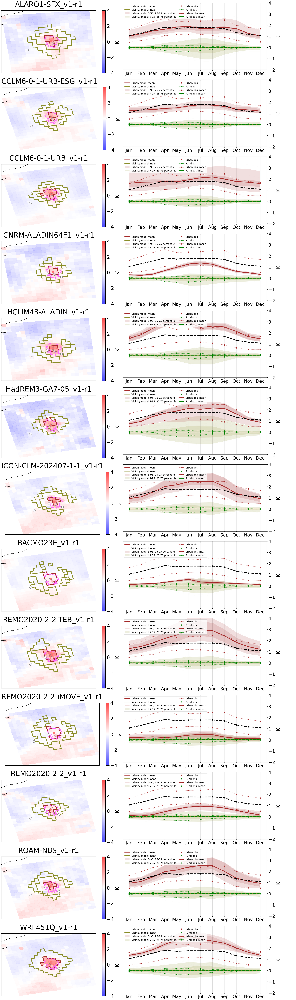

In [28]:
final_img